How to train:

https://www.kaggle.com/code/vexxingbanana/sartorius-mmdetection-training

https://www.kaggle.com/code/vexxingbanana/mmdetection-neuron-inference

https://github.com/open-mmlab/mmdetection/blob/master/demo/MMDet_Tutorial.ipynb

https://mmdetection.readthedocs.io/en/latest/tutorials/customize_dataset.html

In [1]:
!pip install '/kaggle/input/pytorch-170-cuda-toolkit-110221/torch-1.7.0+cu110-cp37-cp37m-linux_x86_64.whl' --no-deps
!pip install '/kaggle/input/pytorch-170-cuda-toolkit-110221/torchvision-0.8.1+cu110-cp37-cp37m-linux_x86_64.whl' --no-deps
!pip install '/kaggle/input/pytorch-170-cuda-toolkit-110221/torchaudio-0.7.0-cp37-cp37m-linux_x86_64.whl' --no-deps

Processing /kaggle/input/pytorch-170-cuda-toolkit-110221/torch-1.7.0+cu110-cp37-cp37m-linux_x86_64.whl
  Attempting uninstall: torch
    Found existing installation: torch 1.11.0
    Uninstalling torch-1.11.0:
      Successfully uninstalled torch-1.11.0
Processing /kaggle/input/pytorch-170-cuda-toolkit-110221/torchvision-0.8.1+cu110-cp37-cp37m-linux_x86_64.whl
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.12.0
    Uninstalling torchvision-0.12.0:
      Successfully uninstalled torchvision-0.12.0
Processing /kaggle/input/pytorch-170-cuda-toolkit-110221/torchaudio-0.7.0-cp37-cp37m-linux_x86_64.whl
  Attempting uninstall: torchaudio
    Found existing installation: torchaudio 0.11.0
    Uninstalling torchaudio-0.11.0:
      Successfully uninstalled torchaudio-0.11.0


In [2]:
!pip install '/kaggle/input/mmdetectionv2140/addict-2.4.0-py3-none-any.whl' --no-deps
!pip install '/kaggle/input/mmdetectionv2140/yapf-0.31.0-py2.py3-none-any.whl' --no-deps
!pip install '/kaggle/input/mmdetectionv2140/terminal-0.4.0-py3-none-any.whl' --no-deps
!pip install '/kaggle/input/mmdetectionv2140/terminaltables-3.1.0-py3-none-any.whl' --no-deps
!pip install '/kaggle/input/mmdetectionv2140/mmcv_full-1_3_8-cu110-torch1_7_0/mmcv_full-1.3.8-cp37-cp37m-manylinux1_x86_64.whl' --no-deps
!pip install '/kaggle/input/mmdetectionv2140/pycocotools-2.0.2/pycocotools-2.0.2' --no-deps
!pip install '/kaggle/input/mmdetectionv2140/mmpycocotools-12.0.3/mmpycocotools-12.0.3' --no-deps

!rm -rf mmdetection

!cp -r /kaggle/input/mmdetectionv2140/mmdetection-2.14.0 /kaggle/working/
!mv /kaggle/working/mmdetection-2.14.0 /kaggle/working/mmdetection
%cd /kaggle/working/mmdetection
!pip install -e .

Processing /kaggle/input/mmdetectionv2140/addict-2.4.0-py3-none-any.whl
Processing /kaggle/input/mmdetectionv2140/yapf-0.31.0-py2.py3-none-any.whl
  Attempting uninstall: yapf
    Found existing installation: yapf 0.32.0
    Uninstalling yapf-0.32.0:
      Successfully uninstalled yapf-0.32.0
Processing /kaggle/input/mmdetectionv2140/terminal-0.4.0-py3-none-any.whl
Processing /kaggle/input/mmdetectionv2140/terminaltables-3.1.0-py3-none-any.whl
Processing /kaggle/input/mmdetectionv2140/mmcv_full-1_3_8-cu110-torch1_7_0/mmcv_full-1.3.8-cp37-cp37m-manylinux1_x86_64.whl
Processing /kaggle/input/mmdetectionv2140/pycocotools-2.0.2/pycocotools-2.0.2
  Preparing metadata (setup.py) ... done
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> [5 lines of output]
      running bdist_wheel
      running build
      running build_py
      creating build
      error: could not create 'build': Read-only file system
      [end of ou

In [3]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torch.nn.functional as F
import sklearn
import torchvision
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import PIL
import json
from PIL import Image, ImageEnhance
import albumentations as A
import mmdet
import mmcv
from albumentations.pytorch import ToTensorV2
import seaborn as sns
import glob
from pathlib import Path
import pycocotools
from pycocotools import mask
import numpy.random
import random
import cv2
import re
from mmdet.datasets import build_dataset
from mmdet.models import build_detector
from mmdet.apis import train_detector
from mmdet.apis import inference_detector, init_detector, show_result_pyplot, set_random_seed

In [118]:
!pip install globox

In [5]:
import numpy as np
import pandas as pd
import cv2
import os
from pathlib import Path
from sklearn.model_selection import train_test_split
import json
import shutil
import matplotlib.pyplot as plt

In [6]:
from kaggle_secrets import UserSecretsClient
import wandb

user_secrets = UserSecretsClient()
wandb_key = user_secrets.get_secret("wandb-key")

wandb.login(key=wandb_key)

wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [7]:
%cd ../

/kaggle/working


In [8]:
shutil.rmtree('./data', ignore_errors=True)
Path("./data/train/images").mkdir(parents=True, exist_ok=True)
Path("./data/train/labels").mkdir(parents=True, exist_ok=True)
Path("./data/val/images").mkdir(parents=True, exist_ok=True)
Path("./data/val/labels").mkdir(parents=True, exist_ok=True)

In [9]:
sample_subm = pd.read_csv('../input/detection-of-human-silhouettes-in-forest-images/omsk/sample_solution.csv')
train = pd.read_csv('../input/detection-of-human-silhouettes-in-forest-images/train_dataset_train/train.csv')
test_dir = '../input/detection-of-human-silhouettes-in-forest-images/test_dataset_test/test'
train_dir = '../input/detection-of-human-silhouettes-in-forest-images/train_dataset_train/train'
train_img_dir = './data/train/images'
train_labels_dir = './data/train/labels'
val_img_dir = './data/val/images'
val_labels_dir = './data/val/labels'

sample_subm['region_shape'] = sample_subm['region_shape'].astype('object')

In [10]:
val_part = pd.concat([train[train.count_region != 0].sample(frac=0.2, random_state=42), train[train.count_region == 0].sample(frac=0.01, random_state=42)])

# train_part = train[~train.isin(val_part)].dropna() # for using all images from train
train_part = train

train_part = pd.concat([train_part[train_part.count_region != 0], train_part[train_part.count_region == 0].sample(frac=0.03, random_state=42)])

In [11]:
len(train_part), len(train_part[train_part.count_region > 0]), len(val_part), len(val_part[val_part.count_region > 0])

(211, 58, 63, 12)

In [12]:
def yolobbox2bbox(x,y,w,h):
    x1, y1 = x-w/2, y-h/2
    x2, y2 = x+w/2, y+h/2
    return x1, y1, x2, y2

# Convert Coco bb to Yolo
def coco_to_yolo(x1, y1, w, h, image_w, image_h):
    return [((2*x1 + w)/(2*image_w)) , ((2*y1 + h)/(2*image_h)), w/image_w, h/image_h]

Example

0 0.6533260233918129 0.5383365821962314 0.023757309941520467 0.04223521767381416
0 25.26153846153846 13.123076923076923 0.8307692307692308 0.8307692307692308
0 39.44444444444444 14.916666666666666 1.1851851851851851 1.1851851851851851
0 26.171875 12.75 0.625 0.625
0 43.4375 19.825 1.275 1.275
0 41.59803921568628 14.450980392156863 1.1372549019607843 1.1372549019607843



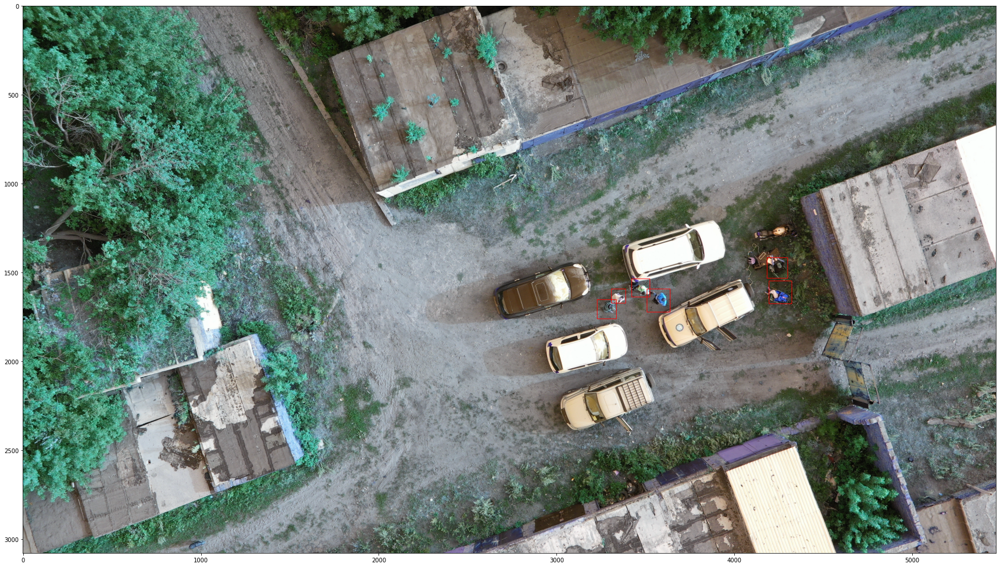

In [13]:
img = cv2.imread(f'{train_dir}/4269.JPG')
h, w = img.shape[0], img.shape[1]

coords_str = train[train.count_region != 0].iloc[6]['region_shape'].replace("'", "")
circle_coords = json.loads(coords_str)
yolo_coords_f = ''
for item in circle_coords:
    cx = item['cx']
    cy = item['cy']
    r = int(item['r'] // 1.5)
#     r = item['r']
    top_left_cornel = (cx - r, cy - r)
    bottom_right_cornel = (cx + r, cy + r)

    yolo_coords = coco_to_yolo(*top_left_cornel, bottom_right_cornel[0] - top_left_cornel[0], bottom_right_cornel[1] - top_left_cornel[1], w, h)
    x1, y1 = top_left_cornel[0], top_left_cornel[1]
    w, h = bottom_right_cornel[0] - top_left_cornel[0], bottom_right_cornel[1] - top_left_cornel[1]
    img = cv2.rectangle(img, (x1, y1), (x1+w, y1+h), (255,0,0), 2)
    
    label = '0 ' + ' '.join(list(map(str, yolo_coords))) + '\n'
    yolo_coords_f = yolo_coords_f + label
plt.figure(figsize=(30, 20))
plt.imshow(img)
print(yolo_coords_f)

In [14]:
def create_lables(df ,train_img_dir, train_labels_dir):
    print('imgs with labels: \n')
    for i, row in df.iterrows():
        shutil.copy(f'{train_dir}/{row["ID_img"]}', train_img_dir)
        if row['count_region'] == 0:
            open(f'{train_labels_dir}/{row["ID_img"].split(".")[0]}.txt', 'a').close()
        else:
            print(f'{train_img_dir}/{row["ID_img"]}')
            img = cv2.imread(f'{train_img_dir}/{row["ID_img"]}')
            h, w = img.shape[0], img.shape[1]

            coords_str = row['region_shape'].replace("'", "")
            circle_coords = json.loads(coords_str)
            yolo_coords_f = ''

            for item in circle_coords:
                cx = item['cx']
                cy = item['cy']
                r = item['r']
                top_left_cornel = (cx - r, cy - r)
                bottom_right_cornel = (cx + r, cy + r)

                yolo_coords = coco_to_yolo(*top_left_cornel, bottom_right_cornel[0] - top_left_cornel[0], bottom_right_cornel[1] - top_left_cornel[1], w, h)

                label = '0 ' + ' '.join(list(map(str, yolo_coords))) + '\n'
                yolo_coords_f = yolo_coords_f + label
            with open(f'{train_labels_dir}/{row["ID_img"].split(".")[0]}.txt', 'a') as label_txt:
                label_txt.write(yolo_coords_f)

In [15]:
create_lables(train_part, train_img_dir, train_labels_dir)
create_lables(val_part, val_img_dir, val_labels_dir)

imgs with labels: 

./data/train/images/3444.jpg
./data/train/images/3653.JPG
./data/train/images/3690.JPG
./data/train/images/3835.JPG
./data/train/images/3947.JPG
./data/train/images/4153.jpg
./data/train/images/4269.JPG
./data/train/images/4291.JPG
./data/train/images/4465.JPG
./data/train/images/4604.JPG
./data/train/images/4780.JPG
./data/train/images/4871.jpg
./data/train/images/4888.JPG
./data/train/images/4934.JPG
./data/train/images/5065.JPG
./data/train/images/5191.JPG
./data/train/images/5277.JPG
./data/train/images/5314.JPG
./data/train/images/5478.JPG
./data/train/images/5680.jpg
./data/train/images/5824.JPG
./data/train/images/5956.JPG
./data/train/images/6105.JPG
./data/train/images/6146.JPG
./data/train/images/6153.JPG
./data/train/images/6219.JPG
./data/train/images/6221.JPG
./data/train/images/6233.JPG
./data/train/images/6368.JPG
./data/train/images/6478.jpg
./data/train/images/6561.JPG
./data/train/images/6684.JPG
./data/train/images/6714.jpg
./data/train/images/674

### Convert labels

In [16]:
# rename JPG to jpg

def rename_jpg_ext(folder: str):
    for path, dirs, files in os.walk(folder):
        for file in files:
            pieces = list(os.path.splitext(file))
            if pieces[-1] == '.JPG':
                pieces[-1] = pieces[-1] = '.jpg'
                new_name = "".join(pieces)
                os.rename(os.path.join(path, file), os.path.join(path, new_name))
                
rename_jpg_ext("./data/train/images/")
rename_jpg_ext("./data/val/images/")      

In [17]:
from globox import AnnotationSet

def yolo_to_coco(image_dir: str, labels_dir: str, coco_ds_name: str, label_to_id):
    yolo_annotations = AnnotationSet.from_yolo(
        folder = Path(labels_dir),
        image_folder = Path(image_dir))
    annot = yolo_annotations.to_coco( 
        label_to_id= label_to_id,
        auto_ids = True, verbose=False)
    
    for a in annot['annotations']:
        a['area'] = a['bbox'][2]*a['bbox'][3] 
     
    annot['categories'] = [{"supercategory": "none", "id": i, "name": l} for l, i in label_to_id.items()]
    
    with open(coco_ds_name, "w") as f:
            json.dump(annot, fp=f, allow_nan=False)

yolo_to_coco(train_img_dir, train_labels_dir, './train.json', {'human': 0})
yolo_to_coco(val_img_dir, val_labels_dir, './val.json', {'human': 0})

In [18]:
with open("/kaggle/working/classes.txt", "w") as classes:
    classes.write("human")

### Install MMDet

In [19]:
# Check nvcc version
!nvcc -V
# Check GCC version
!gcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Wed_Jul_22_19:09:09_PDT_2020
Cuda compilation tools, release 11.0, V11.0.221
Build cuda_11.0_bu.TC445_37.28845127_0
gcc (Ubuntu 9.4.0-1ubuntu1~20.04.1) 9.4.0
Copyright (C) 2019 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [ ]:
# install dependencies: (use cu111 because colab has CUDA 11.1)
# !pip install torch==1.9.0+cu111 torchvision==0.10.0+cu111 -f https://download.pytorch.org/whl/torch_stable.html

# install mmcv-full thus we could use CUDA operators
# !pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.9.0/index.html
# !pip install -U openmim
# !mim install mmcv-full # mmcv-full 

# Install mmdetection
# !rm -rf mmdetection
# !git clone https://github.com/open-mmlab/mmdetection.git
# %cd mmdetection

# !pip install -e .

In [ ]:
# from mmcv import collect_env
# collect_env()

In [ ]:
# Check Pytorch installation
# import torch, torchvision
# print(torch.__version__, torch.cuda.is_available())

# Check MMDetection installation
# import mmdet
# print(mmdet.__version__)

# Check mmcv installation
# from mmcv.ops import get_compiling_cuda_version, get_compiler_version
# print(get_compiling_cuda_version())
# print(get_compiler_version())

In [68]:
%cd mmdetection

[Errno 2] No such file or directory: 'mmdetection'
/kaggle/working/mmdetection


In [69]:
# We download the pre-trained checkpoints for inference and finetuning.
!mkdir checkpoints
!wget -c http://download.openmmlab.com/mmdetection/v2.0/cascade_rcnn/cascade_rcnn_x101_64x4d_fpn_20e_coco/cascade_rcnn_x101_64x4d_fpn_20e_coco_20200509_224357-051557b1.pth \
      -O checkpoints/cascade_rcnn_x101_64x4d_fpn_20e_coco_20200509_224357-051557b1.pth

--2022-11-05 17:06:34--  http://download.openmmlab.com/mmdetection/v2.0/cascade_rcnn/cascade_rcnn_x101_64x4d_fpn_20e_coco/cascade_rcnn_x101_64x4d_fpn_20e_coco_20200509_224357-051557b1.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.252.96.43
Connecting to download.openmmlab.com (download.openmmlab.com)|47.252.96.43|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 510106737 (486M) [application/octet-stream]
Saving to: ‘checkpoints/cascade_rcnn_x101_64x4d_fpn_20e_coco_20200509_224357-051557b1.pth’

checkpoints/cascade 100%[===================>] 486.48M  9.14MB/s    in 59s     

2022-11-05 17:07:36 (8.30 MB/s) - ‘checkpoints/cascade_rcnn_x101_64x4d_fpn_20e_coco_20200509_224357-051557b1.pth’ saved [510106737/510106737]



### Config

In [80]:
from mmcv import Config
cfg = Config.fromfile('/kaggle/working/mmdetection/configs/cascade_rcnn/cascade_rcnn_x101_64x4d_fpn_20e_coco.py')

In [81]:
cfg.dataset_type = 'CocoDataset'
cfg.classes = ['human']
cfg.data_root = '/kaggle/working'

for head in cfg.model.roi_head.bbox_head:
    head.num_classes = 1
    

cfg.data.test.type = 'CocoDataset'
cfg.data.test.classes = ('human',)
cfg.data.test.data_root = '/kaggle/working'
cfg.data.test.ann_file = './val.json'
cfg.data.test.img_prefix = 'data/val/images'

cfg.data.train.type = 'CocoDataset'
cfg.data.train.data_root = '/kaggle/working'
cfg.data.train.ann_file = './train.json'
cfg.data.train.img_prefix = 'data/train/images'
cfg.data.train.classes = ('human',)

cfg.data.val.type = 'CocoDataset'
cfg.data.val.data_root = '/kaggle/working'
cfg.data.val.ann_file = './val.json'
cfg.data.val.img_prefix = 'data/val/images'
cfg.data.val.classes = ('human',)

albu_train_transforms = [
    dict(type='ShiftScaleRotate', shift_limit=0.0625,
         scale_limit=0.15, rotate_limit=15, p=0.4),
    dict(type='RandomBrightnessContrast', brightness_limit=0.2,
         contrast_limit=0.2, p=0.5),
#     dict(type='IAAAffine', shear=(-10.0, 10.0), p=0.4),
#     dict(type='CLAHE', p=0.5),
    dict(
        type="OneOf",
        transforms=[
            dict(type="GaussianBlur", p=1.0, blur_limit=7),
            dict(type="MedianBlur", p=1.0, blur_limit=7),
        ],
        p=0.4,
    ),
]

cfg.train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations', with_bbox=True, with_mask=False),
#     dict(type='Resize', img_scale=[(440, 596), (480, 650), (520, 704), (580, 785), (620, 839)], multiscale_mode='value', keep_ratio=True),
#     dict(type='Resize', img_scale=[(880, 1192), (960, 130), (1040, 1408), (1160, 1570), (1240, 1678)], multiscale_mode='value', keep_ratio=True),
    dict(type='Resize', img_scale=[(1333, 800), (1690, 960)]),
#     dict(type='Resize', img_scale=(1333, 800)),
    
    

    dict(type='RandomFlip', flip_ratio=0.5),

    dict(
        type='Albu',
        transforms=albu_train_transforms,
        bbox_params=dict(
        type='BboxParams',
        format='pascal_voc',
        label_fields=['gt_labels'],
        min_visibility=0.0,
        filter_lost_elements=True),
        keymap=dict(img='image', gt_bboxes='bboxes'),
        update_pad_shape=False,
        skip_img_without_anno=True),
    dict(
        type='Normalize',
        mean=[128, 128, 128],
        std=[11.58, 11.58, 11.58],
        to_rgb=True),
    dict(type='Pad', size_divisor=32),
    dict(type='DefaultFormatBundle'), 
    dict(type='Collect', keys=['img', 'gt_bboxes', 'gt_labels'])
]

cfg.val_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(
        type='MultiScaleFlipAug',
#         img_scale=[(880, 1192), (960, 130), (1040, 1408), (1160, 1570), (1240, 1678)],
        img_scale = [(1333, 800), (1690, 960)],
#         img_scale=(1333, 800),
#         img_scale = (520, 704),
        flip=False,
        transforms=[
            dict(type='Resize', keep_ratio=True),
            dict(type='RandomFlip'),
            dict(
                type='Normalize',
                mean=[128, 128, 128],
                std=[11.58, 11.58, 11.58],
                to_rgb=True),
            dict(type='Pad', size_divisor=32),
            dict(type='ImageToTensor', keys=['img']),
            dict(type='Collect', keys=['img'])
        ])
]


cfg.test_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(
        type='MultiScaleFlipAug',
        img_scale=[(1333, 800), (1690, 960)],
#         img_scale=(1333, 800),
        
#         img_scale = (520, 704),
        flip=False,
        transforms=[
            dict(type='Resize', keep_ratio=True),
            dict(type='RandomFlip'),
            dict(
                type='Normalize',
                mean=[128, 128, 128],
                std=[11.58, 11.58, 11.58],
                to_rgb=True),
            dict(type='Pad', size_divisor=32),
            dict(type='ImageToTensor', keys=['img']),
            dict(type='Collect', keys=['img'])
        ])
]

cfg.data.train.pipeline = cfg.train_pipeline
cfg.data.val.pipeline = cfg.val_pipeline
# cfg.data.test.pipeline = cfg.test_pipeline


cfg.data.test.pipeline[1:] = [
    dict(
        type='MultiScaleFlipAug',
        img_scale=[(1333, 800), (1690, 960)],
#         img_scale=(1333, 800),
        
#         img_scale = (520, 704),
        flip=False,
        transforms=[
            dict(type='Resize', keep_ratio=True),
            dict(type='RandomFlip'),
            dict(
                type='Normalize',
                mean=[128, 128, 128],
                std=[11.58, 11.58, 11.58],
                to_rgb=True),
            dict(type='Pad', size_divisor=32),
            dict(type='ImageToTensor', keys=['img']),
            dict(type='Collect', keys=['img'])
        ])
]


cfg.model.test_cfg.rcnn.max_per_img = 400

cfg.load_from = './checkpoints/cascade_rcnn_x101_64x4d_fpn_20e_coco_20200509_224357-051557b1.pth'

cfg.work_dir = '/kaggle/working/model_output'

cfg.optimizer.lr = 0.02 / 8
cfg.lr_config = dict(
    policy='CosineAnnealing', 
    by_epoch=False,
    warmup='linear', 
    warmup_iters=125, 
    warmup_ratio=0.001,
    min_lr=1e-07)

cfg.data.samples_per_gpu = 1
cfg.data.workers_per_gpu = 0

cfg.evaluation.metric = 'bbox'
cfg.evaluation.interval = 1

cfg.checkpoint_config.interval = 1
cfg.runner.max_epochs = 12 # 12
cfg.log_config.interval = 144

# cfg.model.rpn_head.anchor_generator.base_sizes = [4, 9, 17, 31, 64]
# cfg.model.rpn_head.anchor_generator.strides = [4, 8, 16, 32, 64]

cfg.model.train_cfg.rpn.sampler.num = 1024
cfg.model.train_cfg.rpn_proposal.nms_post = 2000
for rcnn in cfg.model.train_cfg.rcnn:
    rcnn.sampler.num = 3072
cfg.model.test_cfg.rpn.nms_pre = 3000
cfg.model.test_cfg.rpn.nms_post = 3000
# cfg.model.test_cfg.rpn.max_num = 3000
#edits to train and test cfg are from https://github.com/Media-Smart/SKU110K-DenseDet/blob/master/configs/SKU_fusion_bfp_x101_32x4d.py

cfg.seed = 0
set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)
cfg.fp16 = dict(loss_scale=512.0)
meta = dict()
meta['config'] = cfg.pretty_text



print(f'Config:\n{cfg.pretty_text}')

Config:
model = dict(
    type='CascadeRCNN',
    backbone=dict(
        type='ResNeXt',
        depth=101,
        num_stages=4,
        out_indices=(0, 1, 2, 3),
        frozen_stages=1,
        norm_cfg=dict(type='BN', requires_grad=True),
        norm_eval=True,
        style='pytorch',
        init_cfg=dict(
            type='Pretrained', checkpoint='open-mmlab://resnext101_64x4d'),
        groups=64,
        base_width=4),
    neck=dict(
        type='FPN',
        in_channels=[256, 512, 1024, 2048],
        out_channels=256,
        num_outs=5),
    rpn_head=dict(
        type='RPNHead',
        in_channels=256,
        feat_channels=256,
        anchor_generator=dict(
            type='AnchorGenerator',
            scales=[8],
            ratios=[0.5, 1.0, 2.0],
            strides=[4, 8, 16, 32, 64]),
        bbox_coder=dict(
            type='DeltaXYWHBBoxCoder',
            target_means=[0.0, 0.0, 0.0, 0.0],
            target_stds=[1.0, 1.0, 1.0, 1.0]),
        loss_cls=dic

Training

In [82]:
datasets = [build_dataset(cfg.data.train)]
model = build_detector(cfg.model, train_cfg=cfg.get('train_cfg'), test_cfg=cfg.get('test_cfg'))
model.CLASSES = datasets[0].CLASSES

mmcv.mkdir_or_exist(os.path.abspath(cfg.work_dir))
train_detector(model, datasets, cfg, distributed=False, validate=True, meta=meta)

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


2022-11-05 17:11:39,449 - mmdet - INFO - load checkpoint from ./checkpoints/cascade_rcnn_x101_64x4d_fpn_20e_coco_20200509_224357-051557b1.pth
2022-11-05 17:11:39,450 - mmdet - INFO - Use load_from_local loader


loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


2022-11-05 17:11:39,939 - mmdet - WARNING - The model and loaded state dict do not match exactly

size mismatch for roi_head.bbox_head.0.fc_cls.weight: copying a param with shape torch.Size([81, 1024]) from checkpoint, the shape in current model is torch.Size([2, 1024]).
size mismatch for roi_head.bbox_head.0.fc_cls.bias: copying a param with shape torch.Size([81]) from checkpoint, the shape in current model is torch.Size([2]).
size mismatch for roi_head.bbox_head.1.fc_cls.weight: copying a param with shape torch.Size([81, 1024]) from checkpoint, the shape in current model is torch.Size([2, 1024]).
size mismatch for roi_head.bbox_head.1.fc_cls.bias: copying a param with shape torch.Size([81]) from checkpoint, the shape in current model is torch.Size([2]).
size mismatch for roi_head.bbox_head.2.fc_cls.weight: copying a param with shape torch.Size([81, 1024]) from checkpoint, the shape in current model is torch.Size([2, 1024]).
size mismatch for roi_head.bbox_head.2.fc_cls.bias: copying 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 63/63, 1.3 task/s, elapsed: 50s, ETA:     0s

2022-11-05 17:14:22,934 - mmdet - INFO - Evaluating bbox...
2022-11-05 17:14:22,969 - mmdet - INFO - Epoch(val) [1][63]	bbox_mAP: 0.0010, bbox_mAP_50: 0.0020, bbox_mAP_75: 0.0000, bbox_mAP_s: -1.0000, bbox_mAP_m: 0.0000, bbox_mAP_l: 0.0100, bbox_mAP_copypaste: 0.001 0.002 0.000 -1.000 0.000 0.010


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.001
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.002
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.010
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.041
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.041
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.041
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | max

2022-11-05 17:16:16,145 - mmdet - INFO - Saving checkpoint at 2 epochs


[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 63/63, 1.3 task/s, elapsed: 50s, ETA:     0s

2022-11-05 17:17:08,670 - mmdet - INFO - Evaluating bbox...
2022-11-05 17:17:08,723 - mmdet - INFO - Epoch(val) [2][63]	bbox_mAP: 0.0080, bbox_mAP_50: 0.0290, bbox_mAP_75: 0.0010, bbox_mAP_s: -1.0000, bbox_mAP_m: 0.0950, bbox_mAP_l: 0.0630, bbox_mAP_copypaste: 0.008 0.029 0.001 -1.000 0.095 0.063


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.02s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.008
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.029
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.001
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.095
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.063
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.268
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.268
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.268
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | max

2022-11-05 17:18:58,942 - mmdet - INFO - Saving checkpoint at 3 epochs


[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 63/63, 1.2 task/s, elapsed: 51s, ETA:     0s

2022-11-05 17:19:52,595 - mmdet - INFO - Evaluating bbox...
2022-11-05 17:19:52,638 - mmdet - INFO - Epoch(val) [3][63]	bbox_mAP: 0.0250, bbox_mAP_50: 0.0910, bbox_mAP_75: 0.0040, bbox_mAP_s: -1.0000, bbox_mAP_m: 0.3000, bbox_mAP_l: 0.1490, bbox_mAP_copypaste: 0.025 0.091 0.004 -1.000 0.300 0.149


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.025
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.091
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.004
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.300
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.149
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.364
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.364
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.364
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | max

2022-11-05 17:21:46,966 - mmdet - INFO - Saving checkpoint at 4 epochs


[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 63/63, 1.2 task/s, elapsed: 51s, ETA:     0s

2022-11-05 17:22:40,143 - mmdet - INFO - Evaluating bbox...
2022-11-05 17:22:40,187 - mmdet - INFO - Epoch(val) [4][63]	bbox_mAP: 0.1090, bbox_mAP_50: 0.3580, bbox_mAP_75: 0.0110, bbox_mAP_s: -1.0000, bbox_mAP_m: 0.3000, bbox_mAP_l: 0.1580, bbox_mAP_copypaste: 0.109 0.358 0.011 -1.000 0.300 0.158


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.109
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.358
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.011
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.300
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.158
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.355
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.355
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.355
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | max

2022-11-05 17:24:31,381 - mmdet - INFO - Saving checkpoint at 5 epochs


[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 63/63, 1.3 task/s, elapsed: 50s, ETA:     0s

2022-11-05 17:25:24,526 - mmdet - INFO - Evaluating bbox...
2022-11-05 17:25:24,570 - mmdet - INFO - Epoch(val) [5][63]	bbox_mAP: 0.1600, bbox_mAP_50: 0.5510, bbox_mAP_75: 0.0470, bbox_mAP_s: -1.0000, bbox_mAP_m: 0.1000, bbox_mAP_l: 0.1870, bbox_mAP_copypaste: 0.160 0.551 0.047 -1.000 0.100 0.187


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.160
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.551
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.047
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.100
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.187
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.355
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.355
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.355
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | max

2022-11-05 17:27:15,711 - mmdet - INFO - Saving checkpoint at 6 epochs


[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 63/63, 1.3 task/s, elapsed: 50s, ETA:     0s

2022-11-05 17:28:08,505 - mmdet - INFO - Evaluating bbox...
2022-11-05 17:28:08,546 - mmdet - INFO - Epoch(val) [6][63]	bbox_mAP: 0.2160, bbox_mAP_50: 0.6710, bbox_mAP_75: 0.0420, bbox_mAP_s: -1.0000, bbox_mAP_m: 0.1000, bbox_mAP_l: 0.2380, bbox_mAP_copypaste: 0.216 0.671 0.042 -1.000 0.100 0.238


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.216
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.671
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.042
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.100
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.238
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.350
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.350
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.350
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | max

2022-11-05 17:29:59,147 - mmdet - INFO - Saving checkpoint at 7 epochs


[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 63/63, 1.3 task/s, elapsed: 50s, ETA:     0s

2022-11-05 17:30:52,021 - mmdet - INFO - Evaluating bbox...
2022-11-05 17:30:52,080 - mmdet - INFO - Epoch(val) [7][63]	bbox_mAP: 0.2580, bbox_mAP_50: 0.6250, bbox_mAP_75: 0.1060, bbox_mAP_s: -1.0000, bbox_mAP_m: 0.1500, bbox_mAP_l: 0.2820, bbox_mAP_copypaste: 0.258 0.625 0.106 -1.000 0.150 0.282


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.02s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.258
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.625
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.106
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.150
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.282
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.350
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.350
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.350
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | max

2022-11-05 17:32:42,101 - mmdet - INFO - Saving checkpoint at 8 epochs


[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 63/63, 1.3 task/s, elapsed: 50s, ETA:     0s

2022-11-05 17:33:34,821 - mmdet - INFO - Evaluating bbox...
2022-11-05 17:33:34,864 - mmdet - INFO - Epoch(val) [8][63]	bbox_mAP: 0.2800, bbox_mAP_50: 0.6780, bbox_mAP_75: 0.1580, bbox_mAP_s: -1.0000, bbox_mAP_m: 0.1500, bbox_mAP_l: 0.3080, bbox_mAP_copypaste: 0.280 0.678 0.158 -1.000 0.150 0.308


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.280
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.678
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.158
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.150
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.308
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.436
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.436
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.436
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | max

2022-11-05 17:35:26,792 - mmdet - INFO - Saving checkpoint at 9 epochs


[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 63/63, 1.3 task/s, elapsed: 50s, ETA:     0s

2022-11-05 17:36:19,882 - mmdet - INFO - Evaluating bbox...
2022-11-05 17:36:19,922 - mmdet - INFO - Epoch(val) [9][63]	bbox_mAP: 0.2720, bbox_mAP_50: 0.6710, bbox_mAP_75: 0.0840, bbox_mAP_s: -1.0000, bbox_mAP_m: 0.1000, bbox_mAP_l: 0.2960, bbox_mAP_copypaste: 0.272 0.671 0.084 -1.000 0.100 0.296


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.272
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.671
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.084
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.100
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.296
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.400
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.400
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.400
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | max

2022-11-05 17:38:10,714 - mmdet - INFO - Saving checkpoint at 10 epochs


[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 63/63, 1.3 task/s, elapsed: 50s, ETA:     0s

2022-11-05 17:39:03,748 - mmdet - INFO - Evaluating bbox...
2022-11-05 17:39:03,833 - mmdet - INFO - Epoch(val) [10][63]	bbox_mAP: 0.2960, bbox_mAP_50: 0.6340, bbox_mAP_75: 0.1630, bbox_mAP_s: -1.0000, bbox_mAP_m: 0.2000, bbox_mAP_l: 0.3240, bbox_mAP_copypaste: 0.296 0.634 0.163 -1.000 0.200 0.324


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.05s).
Accumulating evaluation results...
DONE (t=0.03s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.296
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.634
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.163
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.200
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.324
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.418
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.418
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.418
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | max

2022-11-05 17:40:53,842 - mmdet - INFO - Saving checkpoint at 11 epochs


[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 63/63, 1.3 task/s, elapsed: 50s, ETA:     0s

2022-11-05 17:41:46,786 - mmdet - INFO - Evaluating bbox...
2022-11-05 17:41:46,832 - mmdet - INFO - Epoch(val) [11][63]	bbox_mAP: 0.3000, bbox_mAP_50: 0.6370, bbox_mAP_75: 0.2180, bbox_mAP_s: -1.0000, bbox_mAP_m: 0.4000, bbox_mAP_l: 0.3280, bbox_mAP_copypaste: 0.300 0.637 0.218 -1.000 0.400 0.328


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.02s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.300
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.637
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.218
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.400
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.328
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.414
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.414
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.414
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | max

2022-11-05 17:43:37,637 - mmdet - INFO - Saving checkpoint at 12 epochs


[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 63/63, 1.3 task/s, elapsed: 50s, ETA:     0s

2022-11-05 17:44:30,404 - mmdet - INFO - Evaluating bbox...
2022-11-05 17:44:30,447 - mmdet - INFO - Epoch(val) [12][63]	bbox_mAP: 0.3000, bbox_mAP_50: 0.6400, bbox_mAP_75: 0.2180, bbox_mAP_s: -1.0000, bbox_mAP_m: 0.2000, bbox_mAP_l: 0.3280, bbox_mAP_copypaste: 0.300 0.640 0.218 -1.000 0.200 0.328


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.300
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.640
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.218
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.200
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.328
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.418
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.418
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.418
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | max

### Test the Trained Detector

In [83]:
img = mmcv.imread('../data/train/images/4269.jpg')

model.cfg = cfg
result = inference_detector(model, img)
# show_result_pyplot(model.to(device), img, result, score_thr=0.75)

/kaggle/working/mmdetection/mmdet/datasets/utils.py:68: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  'data pipeline in your config file.', UserWarning)


In [92]:
val_part[val_part.count_region > 0]

,ID_img,count_region,region_shape
8,3444.jpg,1.0,"['{""cx"":2259,""cy"":391,""r"":64}']"
717,4153.jpg,1.0,"['{""cx"":3731,""cy"":3049,""r"":75}']"
3418,6854.JPG,2.0,"['{""cx"":2782,""cy"":934,""r"":110}', '{""cx"":2246,""..."
1498,4934.JPG,2.0,"['{""cx"":2890,""cy"":775,""r"":110}', '{""cx"":3045,""..."
4277,7713.JPG,3.0,"['{""cx"":2450,""cy"":2092,""r"":84}', '{""cx"":3612,""..."
4782,8218.JPG,4.0,"['{""cx"":3058,""cy"":1907,""r"":92}', '{""cx"":2827,""..."
3475,6911.JPG,2.0,"['{""cx"":2894,""cy"":1229,""r"":124.898}', '{""cx"":2..."
2783,6219.JPG,1.0,"['{""cx"":2408,""cy"":2304,""r"":125}']"
4436,7872.JPG,1.0,"['{""cx"":2900,""cy"":2136,""r"":47}']"
1452,4888.JPG,2.0,"['{""cx"":2188,""cy"":244,""r"":91}', '{""cx"":2237,""c..."


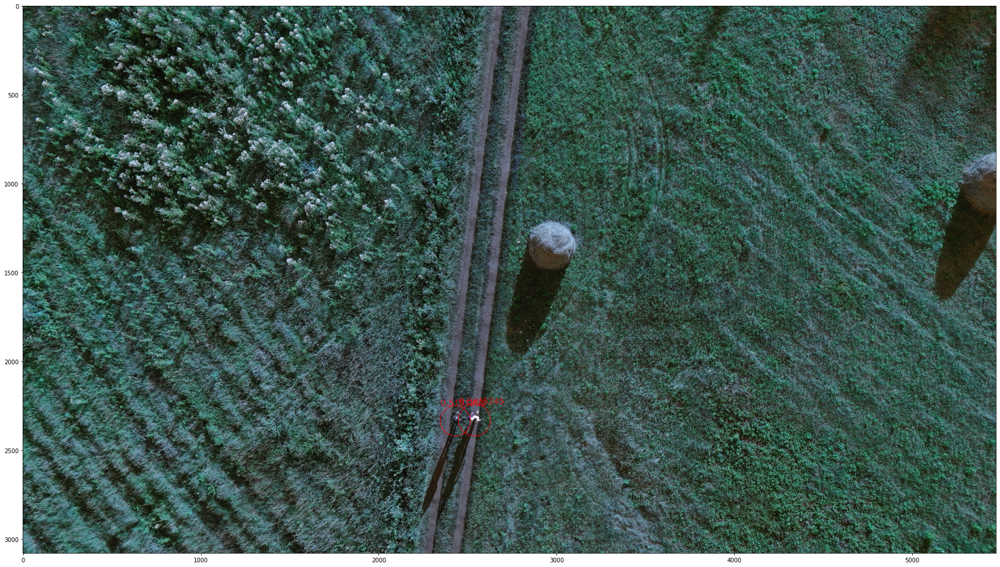

In [103]:
def visualize_predict(img_path, thrh=0.2, circles=True, put_score=True):

    img = mmcv.imread(img_path)
    result = inference_detector(model, img)

    coords_arr = result[0]
    
    for item in coords_arr:
        if item[4] > thrh:
            cx = int((item[2] + item[0]) // 2)
            cy = int((item[3] + item[1]) // 2)
            r = int(item[3] - item[1]) // 2

            w = int((item[2] - item[0]))
            h = int((item[3] - item[1]))

            x1 = int(item[0])
            y1 = int(item[1])
            
            if circles:
                img = cv2.circle(img, (cx, cy), r, (255,0,0), 2)
            else:
                img = cv2.rectangle(img, (x1, y1), (x1+w, y1+h), (255,0,0), 2)
            if put_score:
                img = cv2.putText(img, str(item[4]), (int(item[0]), int(item[1])), cv2.FONT_HERSHEY_SIMPLEX, 1.5, 255, 2)

    plt.figure(figsize=(30, 20))
    plt.imshow(img)
    
# visualize_predict('../../input/detection-of-human-silhouettes-in-forest-images/test_dataset_test/test/890.JPG', thrh = 0.45, circles = True, put_score=True)
visualize_predict('../../input/detection-of-human-silhouettes-in-forest-images/train_dataset_train/train/3835.JPG', thrh = 0.45, circles = True, put_score=True)

Predict test data

In [104]:
import pandas as pd
sample_subm = pd.read_csv('../../input/detection-of-human-silhouettes-in-forest-images/omsk/sample_solution.csv')
sample_subm['region_shape'] = sample_subm['region_shape'].astype('object')
sample_subm.head()

,ID_img,region_shape
0,1.JPG,0
1,2.JPG,0
2,3.JPG,0
3,4.JPG,0
4,5.JPG,0


In [128]:
%%time

from tqdm.notebook import tqdm

test_image_dir = '../../input/detection-of-human-silhouettes-in-forest-images/test_dataset_test/test'
boxes_count_all = 0

thrh = 0.3

for i, row in tqdm(sample_subm.iterrows(), total=sample_subm.shape[0]):
    img = mmcv.imread(f'{test_image_dir}/{row.ID_img}')
    result = inference_detector(model, img)
    
    predict_region_shape = ''
    cxs, cys, rs = [], [], []
    
    for box in result[0]:
        if box[4] > thrh:
            cx = int((box[2] + box[0]) // 2)
            cy = int((box[3] + box[1]) // 2)
            r = int(box[3] - box[1]) // 2
#             r = int((int(box[3] - box[1]) // 2) // 1.5)
            boxes_count_all += 1
            cxs.append(cx)
            cys.append(cy)
            rs.append(r)
    if len(rs) > 0:
        circles = sorted(zip(cxs, cys,rs))
        arr_coords = [f'{{"cx":{cx}, "cy":{cy}, "r":{r}}}' for (cx, cy, rs) in circles]
        sample_subm.at[i, 'region_shape'] = arr_coords
    else:
        sample_subm.at[i, 'region_shape'] = 0 

  0%|          | 0/3435 [00:00<?, ?it/s]

/kaggle/working/mmdetection/mmdet/core/anchor/anchor_generator.py:323: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/kaggle/working/mmdetection/mmdet/core/anchor/anchor_generator.py:360: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


CPU times: user 39min 40s, sys: 2min 33s, total: 42min 14s
Wall time: 42min 3s


In [129]:
len(sample_subm[sample_subm.region_shape != 0]), boxes_count_all

(209, 290)

In [130]:
sample_subm[sample_subm.region_shape != 0].head(15)

,ID_img,region_shape
36,37.JPG,"[{""cx"":3290, ""cy"":1842, ""r"":98}]"
47,48.JPG,"[{""cx"":1171, ""cy"":2506, ""r"":120}, {""cx"":2754, ..."
50,51.JPG,"[{""cx"":534, ""cy"":96, ""r"":20}]"
56,57.JPG,"[{""cx"":423, ""cy"":250, ""r"":15}]"
63,64.jpg,"[{""cx"":3117, ""cy"":1502, ""r"":91}, {""cx"":3253, ""..."
78,79.JPG,"[{""cx"":3116, ""cy"":251, ""r"":103}, {""cx"":3265, ""..."
102,103.JPG,"[{""cx"":274, ""cy"":97, ""r"":16}]"
122,123.JPG,"[{""cx"":1049, ""cy"":2871, ""r"":89}]"
174,175.JPG,"[{""cx"":329, ""cy"":347, ""r"":12}]"
184,185.JPG,"[{""cx"":68, ""cy"":67, ""r"":22}, {""cx"":620, ""cy"":1..."


In [131]:
sample_subm.to_csv('../crcnn_12ep_0_3.csv', index = False)

/kaggle/working/mmdetection/mmdet/core/anchor/anchor_generator.py:323: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/kaggle/working/mmdetection/mmdet/core/anchor/anchor_generator.py:360: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


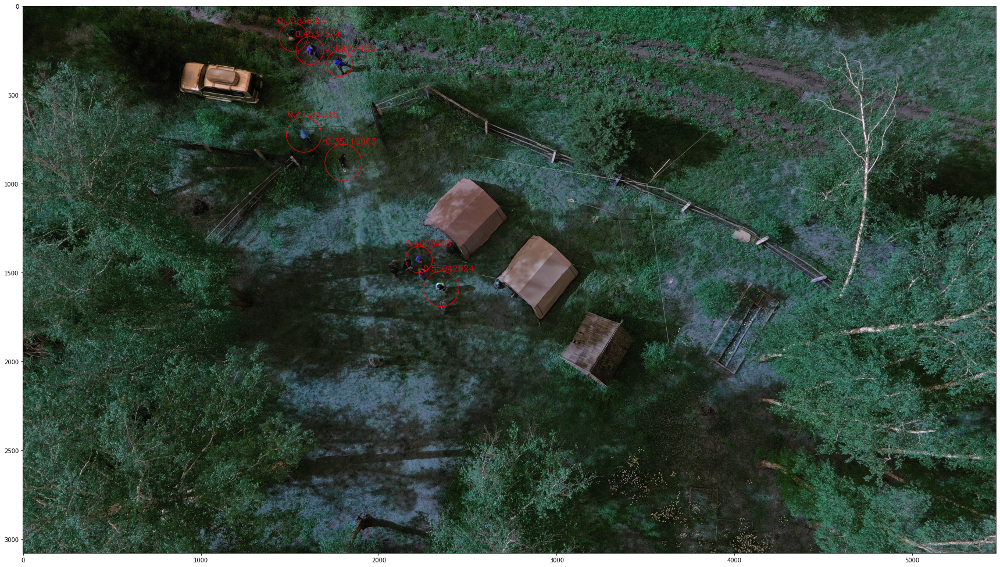

In [132]:
visualize_predict('../../input/detection-of-human-silhouettes-in-forest-images/test_dataset_test/test/337.jpg', thrh = 0.3, circles = True, put_score=True)